In [1]:
!pip install layoutparser torchvision pdf2img

In [ ]:
!pip install "detectron2@git+https://github.com/facebookresearch/detectron2.git@v0.5#egg=detectron2"

In [ ]:
!sudo apt-get install tesseract-ocr

In [ ]:
!sudo apt install poppler-utils

In [16]:
!pip install "layoutparser[ocr]"

In [20]:
from pdf2image import convert_from_path
import layoutparser as lp
import base64
from PIL import Image
import numpy as np
import cv2
import detectron2
from google.colab.patches import cv2_imshow


In [13]:
!pip install pytesseract

In [14]:
import pytesseract

In [2]:
pdf_path = "/content/atterntion.pdf"
ocr_agent = lp.TesseractAgent(languages='eng')

In [ ]:
images = convert_from_path(pdf_path)
model = lp.Detectron2LayoutModel('lp://PubLayNet/mask_rcnn_X_101_32x8d_FPN_3x/config',extra_config=["MODEL.ROI_HEADS.SCORE_THRESH_TEST", 0.4],label_map={0: "Text"})

In [42]:
result = []
for image in images:
  layout_result = model.detect(image)
  text_blocks = lp.Layout([b for b in layout_result])
  texts = []
  for block in text_blocks:
      x_1, y_1, x_2, y_2 = block.coordinates
      x_1 -= 15
      y_1 -= 5
      x_2 += 15
      y_2 += 5
      segment_image = image.crop((x_1, y_1, x_2, y_2))
      text = ocr_agent.detect(segment_image)
      block.set(text=text, inplace= True)
      labeled_img = lp.draw_box(image, text_blocks,  box_width=5, box_alpha=0.2, show_element_type=True, show_element_id=True)
      texts.append(text)
  result.append({'image': image,'labeled_image': labeled_img, 'text': '\n---\n'.join(texts)})

In [37]:
import matplotlib.pyplot as plt

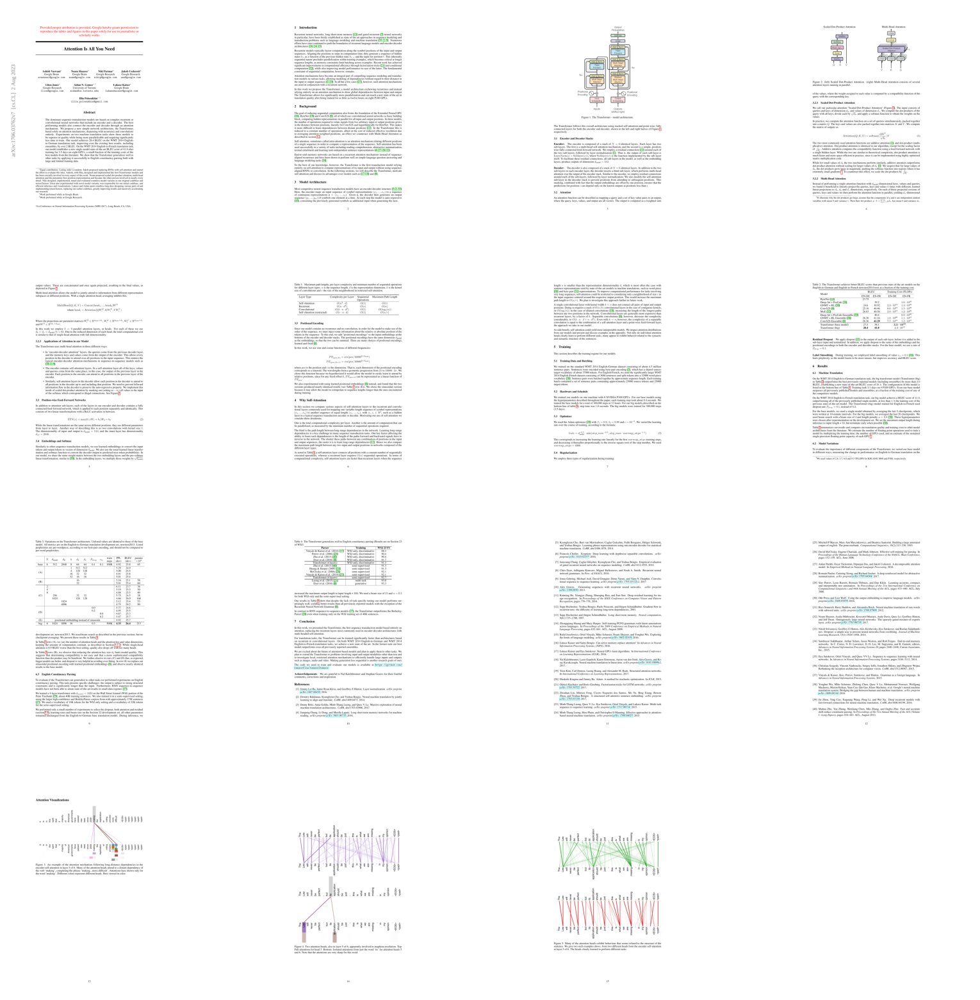

In [43]:
import matplotlib.pyplot as plt
num_images = len(result)
num_rows = (num_images + 4 - 1) // 4
fig, axes = plt.subplots(num_rows, 4, figsize=(20, 20))
axes = axes.flatten()
for i, img in enumerate(result):
    axes[i].imshow(img['image'])
    axes[i].axis('off')
for j in range(num_images, num_rows * 4):
    axes[j].axis('off')
plt.show()


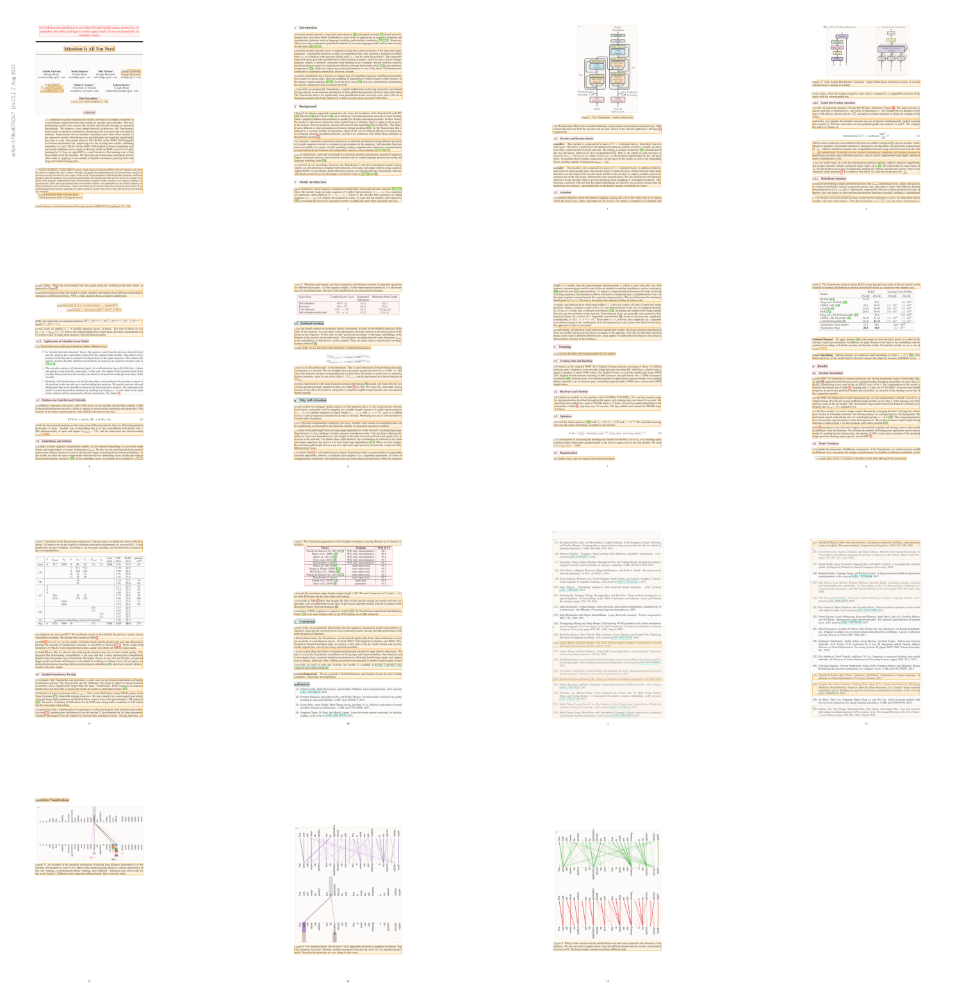

In [44]:
import matplotlib.pyplot as plt
num_images = len(result)
num_rows = (num_images + 4 - 1) // 4
fig, axes = plt.subplots(num_rows, 4, figsize=(20, 20))
axes = axes.flatten()
for i, img in enumerate(result):
    axes[i].imshow(img['labeled_image'])
    axes[i].axis('off')
for j in range(num_images, num_rows * 4):
    axes[j].axis('off')
plt.show()


In [41]:
print(result[0]['text'])

The dominant sequence transduction models are based on complex recurrent or
convolutional neural networks that include an encoder and a decoder. The best
performing models also connect the encoder and decoder through an attention
mechanism. We propose a new simple network architecture, the Transformer,
based solely on attention mechanisms, dispensing with recurrence and convolutions
entirely. Experiments on two machine translation tasks show these models to
be superior in quality while being more parallelizable and requiring significantly
less time to train. Our model achieves 28.4 BLEU on the WMT 2014 English-
to-German translation task, improving over the existing best results, including
ensembles, by over 2 BLEU. On the WMT 2014 English-to-French translation task,
our model establishes a new single-model state-of-the-art BLEU score of 41.8 after
training for 3.5 days on eight GPUs, a small fraction of the training costs of the
best models from the literature. We show that the Transf

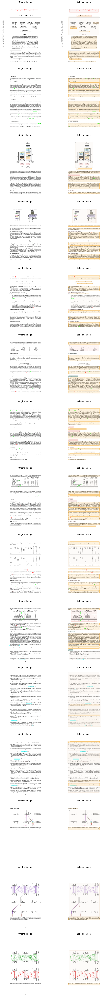

In [50]:
import matplotlib.pyplot as plt
num_rows = len(result)
fig, axes = plt.subplots(num_rows, 2, figsize=(12, 6*num_rows))
for i, pair in enumerate(result):
    axes[i, 0].imshow(pair['image'])
    axes[i, 0].set_title('Original Image')
    axes[i, 0].axis('off')
    axes[i, 1].imshow(pair['labeled_image'])
    axes[i, 1].set_title('Labeled Image')
    axes[i, 1].axis('off')
plt.tight_layout()
plt.show()

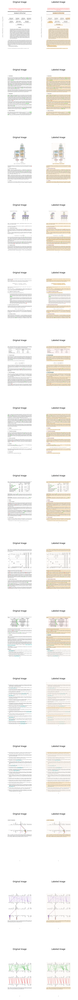

In [54]:
import matplotlib.pyplot as plt

num_rows = len(result)
fig, axes = plt.subplots(num_rows, 2, figsize=(7, 6*num_rows))

for i, pair in enumerate(result):
    axes[i, 0].imshow(pair['image'])
    axes[i, 0].set_title('Original Image')
    axes[i, 0].axis('off')
    axes[i, 1].imshow(pair['labeled_image'])
    axes[i, 1].set_title('Labeled Image')
    axes[i, 1].axis('off')

plt.tight_layout()

# Save the figure as PDF
plt.savefig('output.pdf')

# Show the plot
plt.show()


In [47]:
!pip install reportlab